# Libraries

In [1]:
!pip install pydot graphviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.0/47.0 KB 4.0 MB/s eta 0:00:00
You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


In [2]:
import os
import time
from tqdm import tqdm
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Conv2D, Flatten, ReLU, BatchNormalization, Conv2DTranspose, Dense

from IPython.display import clear_output
from kaggle_datasets import KaggleDatasets
# import matplotlib.animation as animation

AUTOTUNE = tf.data.AUTOTUNE

D0727 07:14:48.909365186      14 config.cc:119]                        gRPC EXPERIMENT tcp_frame_size_tuning               OFF (default:OFF)
D0727 07:14:48.909397297      14 config.cc:119]                        gRPC EXPERIMENT tcp_rcv_lowat                       OFF (default:OFF)
D0727 07:14:48.909400532      14 config.cc:119]                        gRPC EXPERIMENT peer_state_based_framing            OFF (default:OFF)
D0727 07:14:48.909403109      14 config.cc:119]                        gRPC EXPERIMENT flow_control_fixes                  ON  (default:ON)
D0727 07:14:48.909405724      14 config.cc:119]                        gRPC EXPERIMENT memory_pressure_controller          OFF (default:OFF)
D0727 07:14:48.909408249      14 config.cc:119]                        gRPC EXPERIMENT unconstrained_max_quota_buffer_size OFF (default:OFF)
D0727 07:14:48.909410576      14 config.cc:119]                        gRPC EXPERIMENT new_hpack_huffman_decoder           ON  (default:ON)
D0727 07:14:48.

In [3]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
    INPUT_PATH = KaggleDatasets().get_gcs_path()
else:
    strategy = tf.distribute.get_strategy()
    INPUT_PATH = "../input/gan-getting-started"

print("REPLICAS: ", strategy.num_replicas_in_sync)
print("Input Path:", INPUT_PATH)

Running on TPU  
INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local
INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


REPLICAS:  8
Input Path: /kaggle/input/gan-getting-started


get_gcs_path is not required on TPU VMs which can directly use Kaggle datasets, using path: /kaggle/input/gan-getting-started


# Dataset

In [4]:
monet_tfrec_files = tf.io.gfile.glob(INPUT_PATH+"/monet_tfrec/*.tfrec")
photo_tfrec_files = tf.io.gfile.glob(INPUT_PATH+"/photo_tfrec/*.tfrec")

In [5]:
feature_description = {
    'image': tf.io.FixedLenFeature([], tf.string),
}

In [6]:
def parse_tfrecord(record):
    features = tf.io.parse_single_example(record, feature_description)
    
    image = features['image']
    image = tf.io.decode_image(image)
    image = tf.reshape(image, (256, 256, 3))
    
    return image

In [7]:
def normalize(image):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1.0
    
    return image

In [8]:
def random_jitter(image):
    image = tf.image.resize(image, [286, 286], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    image = tf.image.random_crop(image, size=[256,256, 3])
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_saturation(image, 0.7, 1.2)
    return image

In [9]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000
print("Batch Size:", BATCH_SIZE)
print("Buffer Size:", BUFFER_SIZE)

Batch Size: 32
Buffer Size: 1000


In [10]:
!rm -r /kaggle/tmp
!mkdir /kaggle/tmp
!mkdir /kaggle/tmp/monet
!mkdir /kaggle/tmp/photo
!ls /kaggle/tmp

rm: cannot remove '/kaggle/tmp': No such file or directory
monet  photo


 ## Monet Dataset

In [11]:
monet_dataset = tf.data.TFRecordDataset(monet_tfrec_files)
monet_dataset = monet_dataset.map(parse_tfrecord, num_parallel_calls=AUTOTUNE)
# monet_dataset = monet_dataset.cache("/kaggle/tmp/monet")
monet_dataset = monet_dataset.map(random_jitter, num_parallel_calls=AUTOTUNE)
monet_dataset = monet_dataset.map(normalize, num_parallel_calls=AUTOTUNE)
monet_dataset = monet_dataset.repeat()
monet_dataset = monet_dataset.shuffle(BUFFER_SIZE)
monet_dataset = monet_dataset.batch(BATCH_SIZE)
monet_dataset = monet_dataset.prefetch(AUTOTUNE)

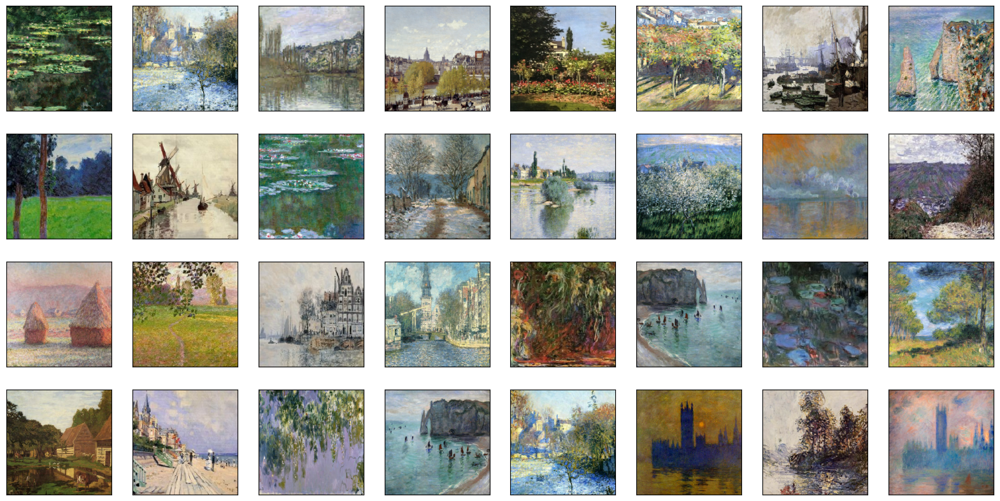

In [12]:
plt.figure(figsize=(20,10))
for images in monet_dataset.take(1):
    for i in range(len(images)):
        plt.subplot(4,8, i+1)
        plt.imshow((images[i]+1)/2)
        plt.xticks([])
        plt.yticks([])

## Photo Dataset

In [13]:
photo_dataset = tf.data.TFRecordDataset(photo_tfrec_files)
photo_dataset = photo_dataset.map(parse_tfrecord, num_parallel_calls=AUTOTUNE)
# photo_dataset = photo_dataset.cache("/kaggle/tmp/photo")
photo_dataset = photo_dataset.map(random_jitter, num_parallel_calls=AUTOTUNE)
photo_dataset = photo_dataset.map(normalize, num_parallel_calls=AUTOTUNE)
photo_dataset = photo_dataset.shuffle(BUFFER_SIZE)
photo_dataset = photo_dataset.batch(BATCH_SIZE)
photo_dataset = photo_dataset.prefetch(AUTOTUNE)

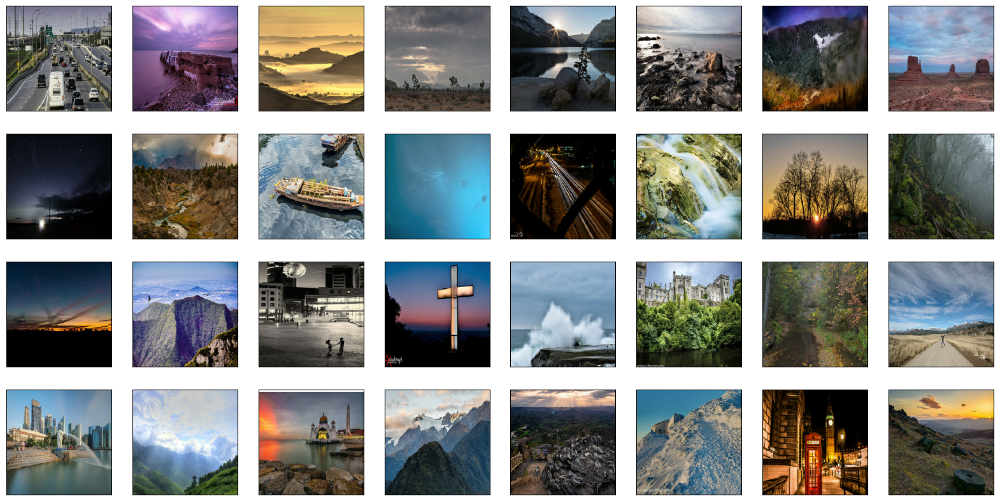

In [14]:
plt.figure(figsize=(20,10))
for images in photo_dataset.take(1):
    for i in range(len(images)):
        plt.subplot(4,8, i+1)
        plt.imshow((images[i]+1)/2)
        plt.xticks([])
        plt.yticks([])

# Models

## Definitions

In [15]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',kernel_initializer=initializer, use_bias=False))
    
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())
    return result

In [16]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))
    
    result.add(tf.keras.layers.BatchNormalization())
    
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
        
    result.add(tf.keras.layers.ReLU())
    
    return result

In [17]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    
    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    
    down1 = downsample(64, 4, False)(inp) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)
    
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                  kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
    
    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
    
    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
    
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
    
    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                  kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
    
    return tf.keras.Model(inputs=[inp], outputs=last)

In [18]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256,256,3])
    
    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]
    
    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]
    
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)
    
    x = inputs
    
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
        
    skips = reversed(skips[:-1])
    
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])
        
    x = last(x)
    
    return tf.keras.Model(inputs=inputs, outputs=x)

In [19]:
with strategy.scope():
    # Instantiate generators
    G_PtoM = Generator()
    G_MtoP = Generator()
    # Instantiate discriminators
    D_P = Discriminator()
    D_M = Discriminator()

### Downsample

In [20]:
tf.keras.utils.plot_model(G_PtoM.layers[1], dpi=64, to_file="downsample.png", show_layer_names=False)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


### Upsample

In [21]:
tf.keras.utils.plot_model(G_PtoM.layers[-3], dpi=64, to_file="upsample.png", show_layer_names=False)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


### Generator

In [22]:
tf.keras.utils.plot_model(G_PtoM, show_shapes=True, dpi=64, to_file="generator.png")

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


### Discriminator

In [23]:
tf.keras.utils.plot_model(D_P, show_shapes=True, dpi=64, to_file="discriminator.png")

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


## Losses

In [24]:
LAMBDA = 10

In [25]:
with strategy.scope():
    loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.SUM)

In [26]:
def discriminator_loss(real, generated):
    real_loss = loss_object(tf.ones_like(real), real)
    generated_loss = loss_object(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    total_disc_loss /= len(real)
    
    return total_disc_loss * 0.5

In [27]:
def generator_loss(generated):
    return loss_object(tf.ones_like(generated), generated)/len(generated)

In [28]:
def calc_cycle_loss(real_image, cycled_image): 
        return LAMBDA * tf.reduce_mean(tf.abs(real_image - cycled_image))

In [29]:
def identity_loss(real_image, same_image):
    return LAMBDA * 0.5 * tf.reduce_mean(tf.abs(real_image - same_image))

## Optimizers

In [30]:
with strategy.scope():
    G_MtoP_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    G_PtoM_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    D_M_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    D_P_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [31]:
def generate_images(model, model_r, test_input, figsize=(12,12)):
    prediction = model(test_input)
    reconstruction = model_r(prediction)
    identity = model_r(test_input)
    
    display_list = [test_input[0], prediction[0], reconstruction[0], identity[0]]
    plt.figure(figsize=figsize)
    title = ['Input', 'Predicted', 'Reconstructed', 'Identity']

    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')

    plt.show()
    
    return display_list

# Model Performance Before Training

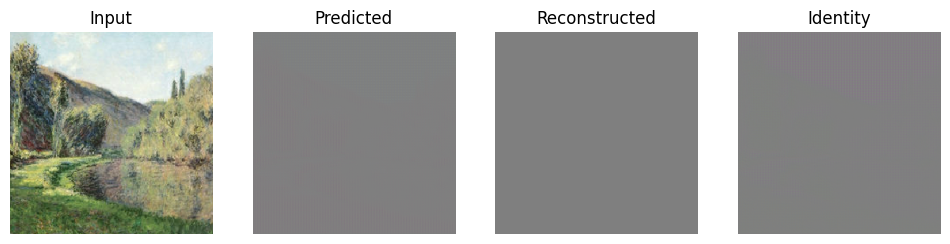

In [32]:
for images in monet_dataset.take(1):
    generate_images(G_MtoP, G_PtoM, images)

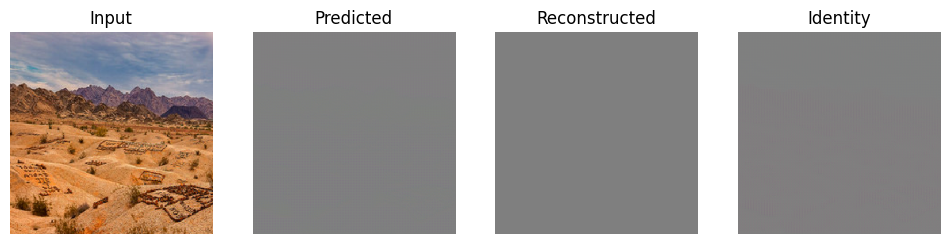

In [33]:
for images in photo_dataset.take(1):
    generate_images(G_PtoM, G_MtoP, images)

# Training

In [34]:
EPOCHS = 100

In [35]:
with strategy.scope():
    G_MtoP_loss = tf.keras.metrics.Mean(name='G_MtoP_loss')
    G_PtoM_loss = tf.keras.metrics.Mean(name='G_PtoM_loss')
    D_M_loss = tf.keras.metrics.Mean(name='D_M_loss')
    D_P_loss = tf.keras.metrics.Mean(name='D_P_loss')

In [36]:
def train_step(real_m, real_p):
    
    with tf.GradientTape(persistent=True) as tape:
        
        # G_PtoM translates P -> M
        # G_MtoP translates M -> M
        
        fake_m = G_PtoM(real_p, training=True)
        cycled_p = G_MtoP(fake_m, training=True)
        
        fake_p = G_MtoP(real_m, training=True)
        cycled_m = G_PtoM(fake_p, training=True)
        
        # same_m and same_p for identity loss
        same_m = G_PtoM(real_m, training=True)
        same_p = G_MtoP(real_p, training=True)
        
        # disctiminator outputs
        disc_real_m = D_M(real_m, training=True)
        disc_real_p = D_P(real_p, training=True)
        
        disc_fake_m = D_M(fake_m, training=True)
        disc_fake_p = D_P(fake_p, training=True)
        
        # Calculate Loss
        gen_MtoP_loss = generator_loss(disc_fake_p)
        gen_PtoM_loss = generator_loss(disc_fake_m)
        
        total_cycle_loss = calc_cycle_loss(real_m, cycled_m) + calc_cycle_loss(real_p, cycled_p)
        
        identity_loss_p = identity_loss(real_p, same_p)
        identity_loss_m = identity_loss(real_m, same_m)
        
        # Total Loss
        total_gen_MtoP_loss = gen_MtoP_loss + total_cycle_loss + identity_loss_p
        total_gen_PtoM_loss = gen_PtoM_loss + total_cycle_loss + identity_loss_m
        
        disc_p_loss = discriminator_loss(disc_real_p, disc_fake_p)
        disc_m_loss = discriminator_loss(disc_real_m, disc_fake_m)
        
    
    # Calculate Gradients
    gen_mtop_gradients = tape.gradient(total_gen_MtoP_loss, G_MtoP.trainable_variables)
    gen_ptom_gradients = tape.gradient(total_gen_PtoM_loss, G_PtoM.trainable_variables)
    disc_m_gradients = tape.gradient(disc_m_loss, D_M.trainable_variables)
    disc_p_gradients= tape.gradient(disc_p_loss, D_P.trainable_variables)
    
    # Apply Gradients to optimizers
    G_MtoP_optimizer.apply_gradients(zip(gen_mtop_gradients, G_MtoP.trainable_variables))
    G_PtoM_optimizer.apply_gradients(zip(gen_ptom_gradients, G_PtoM.trainable_variables))
    D_M_optimizer.apply_gradients(zip(disc_m_gradients, D_M.trainable_variables))
    D_P_optimizer.apply_gradients(zip(disc_p_gradients, D_P.trainable_variables))
    
    # Update Running Loss
    D_M_loss.update_state(disc_m_loss)
    D_P_loss.update_state(disc_p_loss)
    G_MtoP_loss.update_state(total_gen_MtoP_loss)
    G_PtoM_loss.update_state(total_gen_PtoM_loss)

In [37]:
@tf.function
def distributed_train_step(real_m, real_p):
    strategy.run(train_step, args=(real_m, real_p))

In [38]:
# sample_m = next(iter(monet_dataset))
# sample_p = next(iter(photo_dataset))

# ptom_preds_images = []
# mtop_reconstructions_images = []
# ptop_identity_images = []

# mtop_preds_images = []
# ptom_reconstructions_images = []
# mtom_identity_images = []

for epoch in range(EPOCHS):
    
#     clear_output()
#     pmp_display_list = generate_images(G_PtoM, G_MtoP, sample_p)
#     ptom_preds_images.append(pmp_display_list[1])
#     mtop_reconstructions_images.append(pmp_display_list[2])
#     ptop_identity_images.append(pmp_display_list[3])
#     
#     mpm_display_list = generate_images(G_MtoP, G_PtoM, sample_m)
#     mtop_preds_images.append(mpm_display_list[1])
#     ptom_reconstructions_images.append(mpm_display_list[2])
#     mtom_identity_images.append(mpm_display_list[3])
    
    G_MtoP_loss.reset_states()
    G_PtoM_loss.reset_states()
    D_M_loss.reset_states()
    D_P_loss.reset_states()
    
    ds = tf.data.Dataset.zip((photo_dataset, monet_dataset))
    with tqdm(ds, desc="Epoch {}/{}".format(epoch+1, EPOCHS)) as t:
        for image_p, image_m in t:
            distributed_train_step(image_m, image_p)
            t.set_description(
                f"Epoch: {epoch+1}/{EPOCHS}, "
                f"G_MtoP: {G_MtoP_loss.result():.4f}, "
                f"G_PtoM: {G_PtoM_loss.result():.4f}, "
                f"D_M: {D_M_loss.result():.4f}, "
                f"D_P: {D_P_loss.result():.4f}"
            )

Epoch 1/100: 0it [00:00, ?it/s]2023-07-27 07:16:25.715599: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-07-27 07:16:26.508162: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
Epoch: 1/100, G_MtoP: 780.3175, G_PtoM: 717.7005, D_M: 646.0977, D_P: 609.4249: : 219it [03:17,  2.24it/s]2023-07-27 07:19:26.902140: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-07-27 07:19:27.621750: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
Epoch: 1/100, G_MtoP: 779.8259, G_PtoM: 717.2988, D_M: 645.9208, D_P: 609.5337: : 220it [05:17,  1.45s/it]
Epoch: 2/100

### Training Visualisation

In [39]:
# def make_animation(images, title):
#     fig, ax = plt.subplots()
#     plt.title(title)
#     ims = []
#     for image in images:
#         im = ax.imshow(image, animated=True)
#         ims.append([im])
# #     ax.imshow(images[0])
#     ani = animation.ArtistAnimation(fig, ims, repeat_delay=1000, blit=True)
#     return ani 

In [40]:
# plt.rcParams["animation.html"] = "html5"
# make_animation(ptom_preds_images, "PtoM")

In [41]:
# make_animation(mtop_reconstructions_images, "MtoP_Cycle")

In [42]:
# make_animation(ptop_identity_images, "PtoP_Identity")

In [43]:
# make_animation(mtop_preds_images, "MtoP")

In [44]:
# make_animation(ptom_reconstructions_images, "PtoM_Cycle")

In [45]:
# make_animation(mtom_identity_images, "MtoM_Identity")

### Predictions

In [46]:
test_photo_dataset = tf.data.TFRecordDataset(photo_tfrec_files)
test_photo_dataset = test_photo_dataset.map(parse_tfrecord, num_parallel_calls=AUTOTUNE)
test_photo_dataset = test_photo_dataset.map(normalize, num_parallel_calls=AUTOTUNE)
test_photo_dataset = test_photo_dataset.batch(BATCH_SIZE)
# test_photo_dataset = photo_dataset

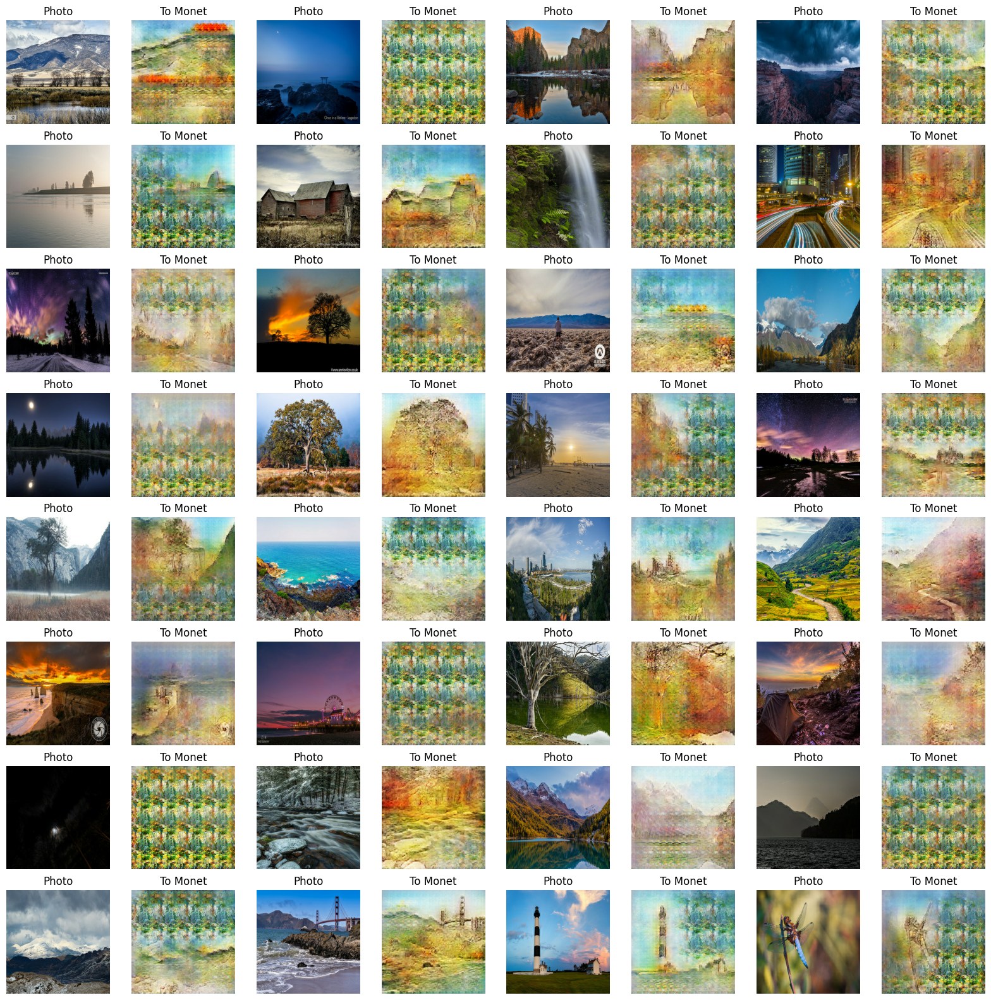

In [47]:
plt.figure(figsize=(20,20))
for images in test_photo_dataset.take(1):
    predictions = G_PtoM(images, training=False)
    for i in range(len(images)):
        plt.subplot(8,8, 2*i+1)
        plt.imshow((images[i]+1)/2)
        plt.title("Photo")
        plt.axis('off')

        plt.subplot(8,8, 2*i+2)
        plt.imshow((predictions[i]+1)/2)
        plt.title("To Monet")
        plt.axis('off')

In [48]:
def get_image(arr):
    arr = (arr + 1) * 127.5
    arr = tf.cast(arr, tf.int8)
    return tf.keras.preprocessing.image.array_to_img(arr)

In [49]:
from zipfile import ZipFile

file_index = 1
with ZipFile('images.zip', 'w') as submission_zip:
    for images in tqdm(test_photo_dataset):
        predictions = G_PtoM.predict(images)
        for prediction in predictions:
            filename = f'photo_to_monet_{file_index}.jpg'
            img = get_image(prediction)
            img.save(filename)
            submission_zip.write(filename)
            os.remove(filename)
            file_index+=1
        if file_index>=9950:
            break
    submission_zip.close()
    
print(f"Saved {file_index} files in images.zip")

0it [00:00, ?it/s]2023-07-27 10:08:31.693519: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-07-27 10:08:31.735905: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


1/1 [==============================] - 9s 9s/step


1it [00:09,  9.50s/it]

1/1 [==============================] - 1s 516ms/step


2it [00:10,  4.33s/it]

1/1 [==============================] - 1s 515ms/step


3it [00:10,  2.67s/it]

1/1 [==============================] - 0s 486ms/step


4it [00:11,  1.92s/it]

1/1 [==============================] - 0s 455ms/step


5it [00:12,  1.45s/it]

1/1 [==============================] - 0s 458ms/step


6it [00:12,  1.17s/it]

1/1 [==============================] - 0s 456ms/step


7it [00:13,  1.01it/s]

1/1 [==============================] - 0s 447ms/step


8it [00:14,  1.14it/s]

1/1 [==============================] - 0s 470ms/step


9it [00:14,  1.24it/s]

1/1 [==============================] - 0s 473ms/step


10it [00:15,  1.32it/s]

1/1 [==============================] - 0s 471ms/step


11it [00:16,  1.38it/s]

1/1 [==============================] - 0s 455ms/step


12it [00:16,  1.43it/s]

1/1 [==============================] - 0s 474ms/step


13it [00:17,  1.46it/s]

1/1 [==============================] - 1s 1s/step


14it [00:18,  1.13it/s]

1/1 [==============================] - 0s 470ms/step


15it [00:19,  1.23it/s]

1/1 [==============================] - 0s 473ms/step


16it [00:20,  1.30it/s]

1/1 [==============================] - 0s 481ms/step


17it [00:20,  1.36it/s]

1/1 [==============================] - 0s 479ms/step


18it [00:21,  1.40it/s]

1/1 [==============================] - 0s 451ms/step


19it [00:22,  1.45it/s]

1/1 [==============================] - 0s 450ms/step


20it [00:22,  1.50it/s]

1/1 [==============================] - 0s 454ms/step


21it [00:23,  1.52it/s]

1/1 [==============================] - 0s 462ms/step


22it [00:23,  1.53it/s]

1/1 [==============================] - 1s 545ms/step


23it [00:24,  1.48it/s]

1/1 [==============================] - 0s 466ms/step


24it [00:25,  1.49it/s]

1/1 [==============================] - 0s 452ms/step


25it [00:25,  1.52it/s]

1/1 [==============================] - 0s 455ms/step


26it [00:26,  1.54it/s]

1/1 [==============================] - 0s 455ms/step


27it [00:27,  1.53it/s]

1/1 [==============================] - 0s 457ms/step


28it [00:27,  1.55it/s]

1/1 [==============================] - 0s 451ms/step


29it [00:28,  1.56it/s]

1/1 [==============================] - 0s 453ms/step


30it [00:29,  1.57it/s]

1/1 [==============================] - 1s 500ms/step


31it [00:29,  1.54it/s]

1/1 [==============================] - 0s 461ms/step


32it [00:30,  1.54it/s]

1/1 [==============================] - 1s 503ms/step


33it [00:31,  1.51it/s]

1/1 [==============================] - 0s 478ms/step


34it [00:31,  1.49it/s]

1/1 [==============================] - 0s 473ms/step


35it [00:32,  1.51it/s]

1/1 [==============================] - 0s 477ms/step


36it [00:33,  1.52it/s]

1/1 [==============================] - 0s 448ms/step


37it [00:33,  1.55it/s]

1/1 [==============================] - 0s 451ms/step


38it [00:34,  1.55it/s]

1/1 [==============================] - 0s 460ms/step


39it [00:35,  1.56it/s]

1/1 [==============================] - 0s 460ms/step


40it [00:35,  1.56it/s]

1/1 [==============================] - 0s 451ms/step


41it [00:36,  1.58it/s]

1/1 [==============================] - 0s 456ms/step


42it [00:36,  1.58it/s]

1/1 [==============================] - 0s 482ms/step


43it [00:37,  1.55it/s]

1/1 [==============================] - 0s 469ms/step


44it [00:38,  1.54it/s]

1/1 [==============================] - 0s 456ms/step


45it [00:38,  1.55it/s]

1/1 [==============================] - 0s 447ms/step


46it [00:39,  1.56it/s]

1/1 [==============================] - 0s 457ms/step


47it [00:40,  1.56it/s]

1/1 [==============================] - 0s 449ms/step


48it [00:40,  1.57it/s]

1/1 [==============================] - 0s 444ms/step


49it [00:41,  1.59it/s]

1/1 [==============================] - 0s 452ms/step


50it [00:42,  1.58it/s]

1/1 [==============================] - 0s 450ms/step


51it [00:42,  1.59it/s]

1/1 [==============================] - 0s 454ms/step


52it [00:43,  1.59it/s]

1/1 [==============================] - 0s 485ms/step


53it [00:43,  1.56it/s]

1/1 [==============================] - 0s 481ms/step


54it [00:44,  1.54it/s]

1/1 [==============================] - 0s 455ms/step


55it [00:45,  1.55it/s]

1/1 [==============================] - 1s 1s/step


56it [00:46,  1.14it/s]

1/1 [==============================] - 1s 542ms/step


57it [00:47,  1.20it/s]

1/1 [==============================] - 0s 493ms/step


58it [00:48,  1.27it/s]

1/1 [==============================] - 0s 469ms/step


59it [00:48,  1.34it/s]

1/1 [==============================] - 0s 467ms/step


60it [00:49,  1.40it/s]

1/1 [==============================] - 1s 537ms/step


61it [00:50,  1.40it/s]

1/1 [==============================] - 1s 525ms/step


62it [00:50,  1.40it/s]

1/1 [==============================] - 0s 456ms/step


63it [00:51,  1.45it/s]

1/1 [==============================] - 0s 464ms/step


64it [00:52,  1.48it/s]

1/1 [==============================] - 0s 453ms/step


65it [00:52,  1.51it/s]

1/1 [==============================] - 0s 462ms/step


66it [00:53,  1.53it/s]

1/1 [==============================] - 0s 454ms/step


67it [00:53,  1.55it/s]

1/1 [==============================] - 0s 448ms/step


68it [00:54,  1.57it/s]

1/1 [==============================] - 0s 453ms/step


69it [00:55,  1.58it/s]

1/1 [==============================] - 0s 446ms/step


70it [00:55,  1.59it/s]

1/1 [==============================] - 1s 516ms/step


71it [00:56,  1.54it/s]

1/1 [==============================] - 1s 595ms/step


72it [00:57,  1.46it/s]

1/1 [==============================] - 0s 467ms/step


73it [00:57,  1.47it/s]

1/1 [==============================] - 0s 450ms/step


74it [00:58,  1.51it/s]

1/1 [==============================] - 0s 450ms/step


75it [00:59,  1.53it/s]

1/1 [==============================] - 1s 503ms/step


76it [00:59,  1.52it/s]

1/1 [==============================] - 0s 458ms/step


77it [01:00,  1.54it/s]

1/1 [==============================] - 0s 448ms/step


78it [01:01,  1.56it/s]

1/1 [==============================] - 0s 465ms/step


79it [01:01,  1.56it/s]

1/1 [==============================] - 0s 483ms/step


80it [01:02,  1.54it/s]

1/1 [==============================] - 0s 450ms/step


81it [01:03,  1.56it/s]

1/1 [==============================] - 1s 615ms/step


82it [01:03,  1.45it/s]

1/1 [==============================] - 0s 474ms/step


83it [01:04,  1.48it/s]

1/1 [==============================] - 0s 465ms/step


84it [01:05,  1.50it/s]

1/1 [==============================] - 0s 460ms/step


85it [01:05,  1.53it/s]

1/1 [==============================] - 0s 447ms/step


86it [01:06,  1.55it/s]

1/1 [==============================] - 0s 444ms/step


87it [01:07,  1.57it/s]

1/1 [==============================] - 0s 466ms/step


88it [01:07,  1.57it/s]

1/1 [==============================] - 0s 451ms/step


89it [01:08,  1.58it/s]

1/1 [==============================] - 0s 450ms/step


90it [01:08,  1.59it/s]

1/1 [==============================] - 0s 462ms/step


91it [01:09,  1.58it/s]

1/1 [==============================] - 1s 589ms/step


92it [01:10,  1.48it/s]

1/1 [==============================] - 0s 462ms/step


93it [01:10,  1.50it/s]

1/1 [==============================] - 0s 445ms/step


94it [01:11,  1.53it/s]

1/1 [==============================] - 0s 455ms/step


95it [01:12,  1.55it/s]

1/1 [==============================] - 0s 448ms/step


96it [01:12,  1.57it/s]

1/1 [==============================] - 0s 471ms/step


97it [01:13,  1.56it/s]

1/1 [==============================] - 1s 1s/step


98it [01:14,  1.13it/s]

1/1 [==============================] - 1s 523ms/step


99it [01:15,  1.20it/s]

1/1 [==============================] - 1s 517ms/step


100it [01:16,  1.26it/s]

1/1 [==============================] - 1s 532ms/step


101it [01:17,  1.29it/s]

1/1 [==============================] - 0s 478ms/step


102it [01:17,  1.35it/s]

1/1 [==============================] - 0s 466ms/step


103it [01:18,  1.40it/s]

1/1 [==============================] - 0s 480ms/step


104it [01:19,  1.43it/s]

1/1 [==============================] - 0s 482ms/step


105it [01:19,  1.45it/s]

1/1 [==============================] - 0s 467ms/step


106it [01:20,  1.47it/s]

1/1 [==============================] - 0s 459ms/step


107it [01:21,  1.50it/s]

1/1 [==============================] - 0s 460ms/step


108it [01:21,  1.53it/s]

1/1 [==============================] - 0s 461ms/step


109it [01:22,  1.54it/s]

1/1 [==============================] - 0s 463ms/step


110it [01:22,  1.53it/s]

1/1 [==============================] - 0s 468ms/step


111it [01:23,  1.53it/s]

1/1 [==============================] - 0s 470ms/step


112it [01:24,  1.54it/s]

1/1 [==============================] - 0s 474ms/step


113it [01:24,  1.54it/s]

1/1 [==============================] - 0s 453ms/step


114it [01:25,  1.55it/s]

1/1 [==============================] - 0s 445ms/step


115it [01:26,  1.57it/s]

1/1 [==============================] - 0s 448ms/step


116it [01:26,  1.58it/s]

1/1 [==============================] - 0s 458ms/step


117it [01:27,  1.58it/s]

1/1 [==============================] - 0s 451ms/step


118it [01:28,  1.59it/s]

1/1 [==============================] - 0s 451ms/step


119it [01:28,  1.58it/s]

1/1 [==============================] - 0s 466ms/step


120it [01:29,  1.56it/s]

1/1 [==============================] - 1s 546ms/step


121it [01:30,  1.50it/s]

1/1 [==============================] - 0s 488ms/step


122it [01:30,  1.50it/s]

1/1 [==============================] - 0s 454ms/step


123it [01:31,  1.53it/s]

1/1 [==============================] - 0s 455ms/step


124it [01:31,  1.55it/s]

1/1 [==============================] - 0s 464ms/step


125it [01:32,  1.56it/s]

1/1 [==============================] - 0s 448ms/step


126it [01:33,  1.57it/s]

1/1 [==============================] - 0s 451ms/step


127it [01:33,  1.58it/s]

1/1 [==============================] - 0s 449ms/step


128it [01:34,  1.59it/s]

1/1 [==============================] - 0s 482ms/step


129it [01:35,  1.56it/s]

1/1 [==============================] - 0s 468ms/step


130it [01:35,  1.56it/s]

1/1 [==============================] - 1s 505ms/step


131it [01:36,  1.53it/s]

1/1 [==============================] - 0s 496ms/step


132it [01:37,  1.51it/s]

1/1 [==============================] - 0s 446ms/step


133it [01:37,  1.53it/s]

1/1 [==============================] - 0s 447ms/step


134it [01:38,  1.55it/s]

1/1 [==============================] - 0s 449ms/step


135it [01:39,  1.57it/s]

1/1 [==============================] - 0s 454ms/step


136it [01:39,  1.57it/s]

1/1 [==============================] - 0s 462ms/step


137it [01:40,  1.56it/s]

1/1 [==============================] - 0s 454ms/step


138it [01:40,  1.57it/s]

1/1 [==============================] - 0s 443ms/step


139it [01:41,  1.59it/s]

1/1 [==============================] - 1s 1s/step


140it [01:43,  1.12it/s]

1/1 [==============================] - 1s 533ms/step


141it [01:43,  1.19it/s]

1/1 [==============================] - 1s 517ms/step


142it [01:44,  1.25it/s]

1/1 [==============================] - 1s 520ms/step


143it [01:45,  1.29it/s]

1/1 [==============================] - 0s 480ms/step


144it [01:45,  1.35it/s]

1/1 [==============================] - 0s 471ms/step


145it [01:46,  1.40it/s]

1/1 [==============================] - 0s 476ms/step


146it [01:47,  1.44it/s]

1/1 [==============================] - 0s 460ms/step


147it [01:47,  1.47it/s]

1/1 [==============================] - 0s 480ms/step


148it [01:48,  1.49it/s]

1/1 [==============================] - 0s 478ms/step


149it [01:49,  1.50it/s]

1/1 [==============================] - 1s 507ms/step


150it [01:49,  1.48it/s]

1/1 [==============================] - 0s 460ms/step


151it [01:50,  1.50it/s]

1/1 [==============================] - 0s 455ms/step


152it [01:51,  1.53it/s]

1/1 [==============================] - 0s 445ms/step


153it [01:51,  1.56it/s]

1/1 [==============================] - 0s 450ms/step


154it [01:52,  1.57it/s]

1/1 [==============================] - 0s 454ms/step


155it [01:52,  1.58it/s]

1/1 [==============================] - 0s 451ms/step


156it [01:53,  1.58it/s]

1/1 [==============================] - 0s 460ms/step


157it [01:54,  1.58it/s]

1/1 [==============================] - 0s 449ms/step


158it [01:54,  1.58it/s]

1/1 [==============================] - 0s 458ms/step


159it [01:55,  1.57it/s]

1/1 [==============================] - 0s 485ms/step


160it [01:56,  1.55it/s]

1/1 [==============================] - 0s 456ms/step


161it [01:56,  1.56it/s]

1/1 [==============================] - 0s 447ms/step


162it [01:57,  1.57it/s]

1/1 [==============================] - 0s 440ms/step


163it [01:58,  1.59it/s]

1/1 [==============================] - 0s 453ms/step


164it [01:58,  1.59it/s]

1/1 [==============================] - 0s 445ms/step


165it [01:59,  1.60it/s]

1/1 [==============================] - 0s 462ms/step


166it [01:59,  1.59it/s]

1/1 [==============================] - 0s 458ms/step


167it [02:00,  1.57it/s]

1/1 [==============================] - 0s 450ms/step


168it [02:01,  1.58it/s]

1/1 [==============================] - 0s 448ms/step


169it [02:01,  1.59it/s]

1/1 [==============================] - 0s 456ms/step


170it [02:02,  1.57it/s]

1/1 [==============================] - 0s 481ms/step


171it [02:03,  1.55it/s]

1/1 [==============================] - 0s 453ms/step


172it [02:03,  1.56it/s]

1/1 [==============================] - 0s 447ms/step


173it [02:04,  1.57it/s]

1/1 [==============================] - 0s 453ms/step


174it [02:05,  1.58it/s]

1/1 [==============================] - 0s 486ms/step


175it [02:05,  1.55it/s]

1/1 [==============================] - 0s 457ms/step


176it [02:06,  1.56it/s]

1/1 [==============================] - 0s 449ms/step


177it [02:06,  1.58it/s]

1/1 [==============================] - 0s 460ms/step


178it [02:07,  1.58it/s]

1/1 [==============================] - 0s 446ms/step


179it [02:08,  1.59it/s]

1/1 [==============================] - 0s 492ms/step


180it [02:08,  1.56it/s]

1/1 [==============================] - 0s 499ms/step


181it [02:09,  1.52it/s]

1/1 [==============================] - 1s 1s/step


182it [02:11,  1.11it/s]

1/1 [==============================] - 1s 552ms/step


183it [02:11,  1.17it/s]

1/1 [==============================] - 1s 539ms/step


184it [02:12,  1.22it/s]

1/1 [==============================] - 0s 481ms/step


185it [02:13,  1.30it/s]

1/1 [==============================] - 0s 482ms/step


186it [02:13,  1.35it/s]

1/1 [==============================] - 0s 459ms/step


187it [02:14,  1.41it/s]

1/1 [==============================] - 0s 482ms/step


188it [02:15,  1.44it/s]

1/1 [==============================] - 1s 538ms/step


189it [02:15,  1.43it/s]

1/1 [==============================] - 0s 493ms/step


190it [02:16,  1.44it/s]

1/1 [==============================] - 0s 451ms/step


191it [02:17,  1.47it/s]

1/1 [==============================] - 0s 498ms/step


192it [02:17,  1.47it/s]

1/1 [==============================] - 0s 470ms/step


193it [02:18,  1.49it/s]

1/1 [==============================] - 0s 458ms/step


194it [02:19,  1.52it/s]

1/1 [==============================] - 0s 454ms/step


195it [02:19,  1.54it/s]

1/1 [==============================] - 0s 452ms/step


196it [02:20,  1.56it/s]

1/1 [==============================] - 0s 488ms/step


197it [02:21,  1.54it/s]

1/1 [==============================] - 0s 463ms/step


198it [02:21,  1.55it/s]

1/1 [==============================] - 1s 611ms/step


199it [02:22,  1.45it/s]

1/1 [==============================] - 0s 478ms/step


200it [02:23,  1.47it/s]

1/1 [==============================] - 0s 454ms/step


201it [02:23,  1.50it/s]

1/1 [==============================] - 0s 464ms/step


202it [02:24,  1.52it/s]

1/1 [==============================] - 0s 444ms/step


203it [02:24,  1.55it/s]

1/1 [==============================] - 0s 445ms/step


204it [02:25,  1.58it/s]

1/1 [==============================] - 0s 454ms/step


205it [02:26,  1.58it/s]

1/1 [==============================] - 0s 451ms/step


206it [02:26,  1.59it/s]

1/1 [==============================] - 0s 450ms/step


207it [02:27,  1.59it/s]

1/1 [==============================] - 0s 465ms/step


208it [02:28,  1.58it/s]

1/1 [==============================] - 1s 529ms/step


209it [02:28,  1.52it/s]

1/1 [==============================] - 1s 502ms/step


210it [02:29,  1.51it/s]

1/1 [==============================] - 0s 441ms/step


211it [02:30,  1.54it/s]

1/1 [==============================] - 0s 443ms/step


212it [02:30,  1.57it/s]

1/1 [==============================] - 0s 452ms/step


213it [02:31,  1.56it/s]

1/1 [==============================] - 0s 455ms/step


214it [02:32,  1.57it/s]

1/1 [==============================] - 0s 446ms/step


215it [02:32,  1.59it/s]

1/1 [==============================] - 0s 453ms/step


216it [02:33,  1.59it/s]

1/1 [==============================] - 0s 447ms/step


217it [02:33,  1.60it/s]

1/1 [==============================] - 0s 444ms/step


218it [02:34,  1.61it/s]

1/1 [==============================] - 0s 481ms/step


219it [02:35,  1.56it/s]2023-07-27 10:11:07.052193: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-07-27 10:11:07.153570: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


1/1 [==============================] - 9s 9s/step


220it [02:44,  1.34it/s]

Saved 7039 files in images.zip
